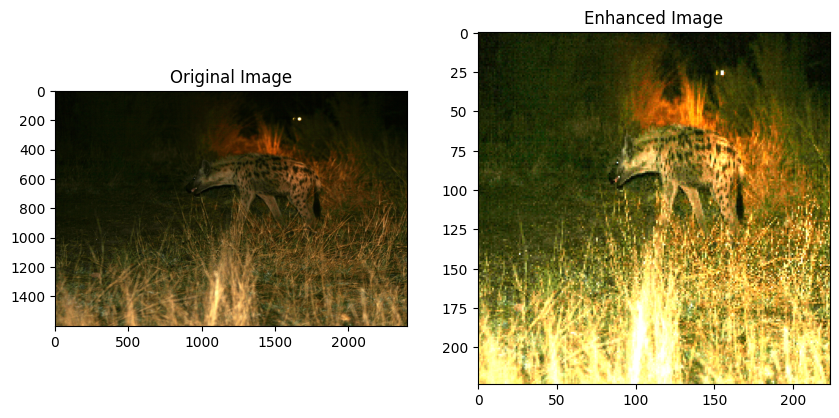

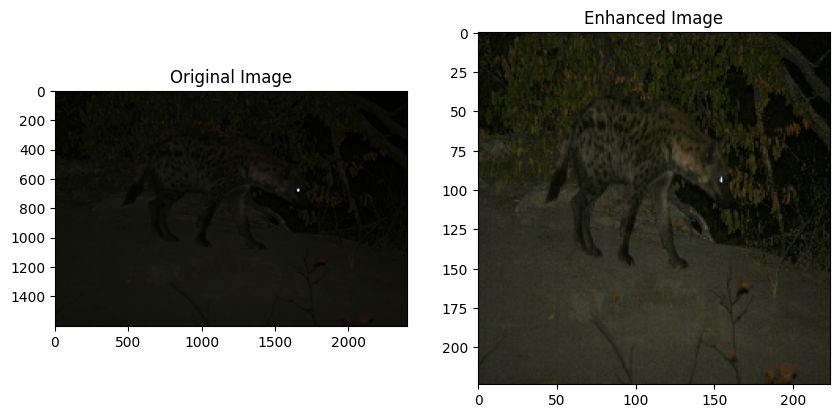

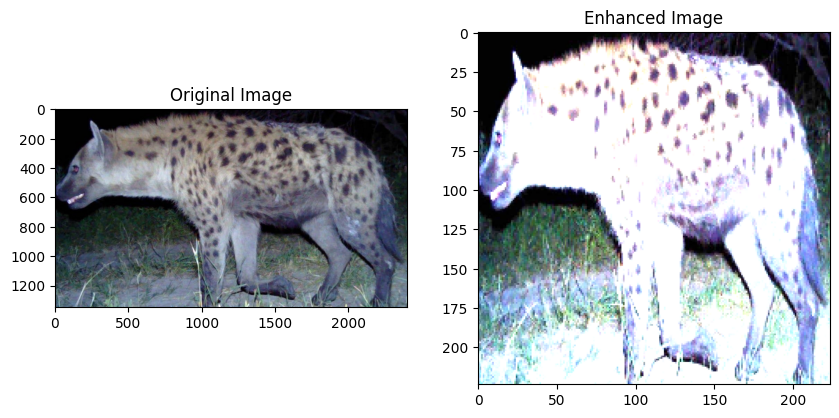

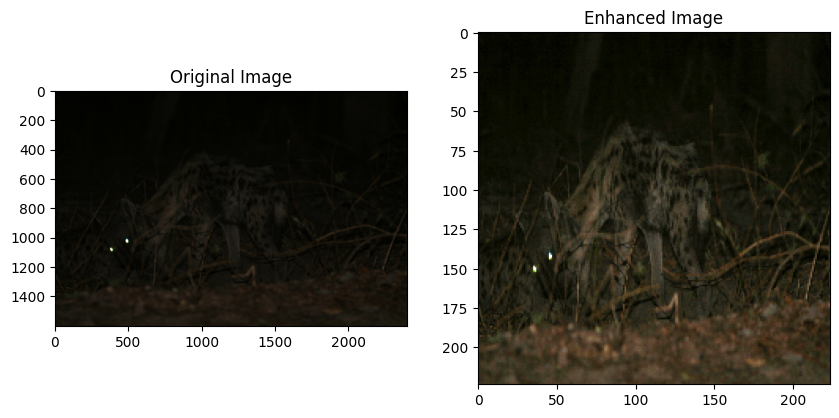

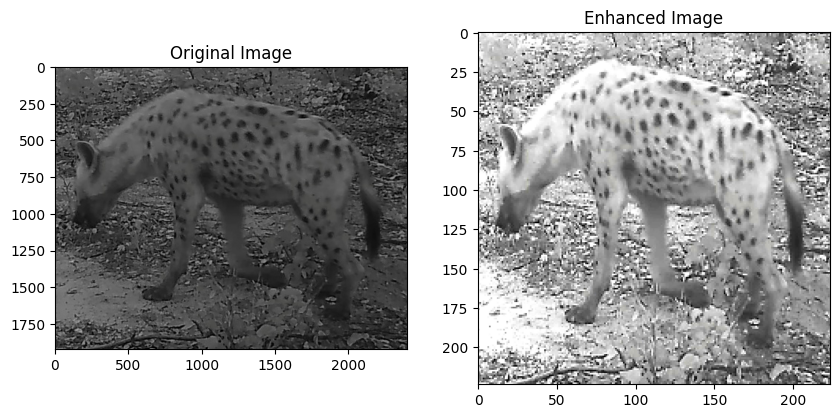

...

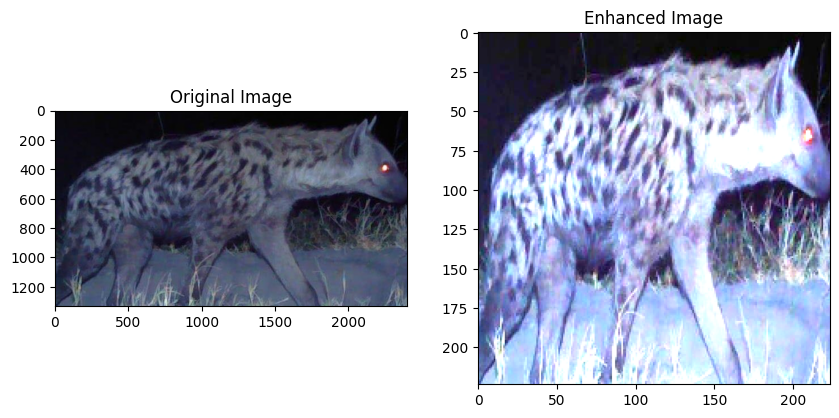

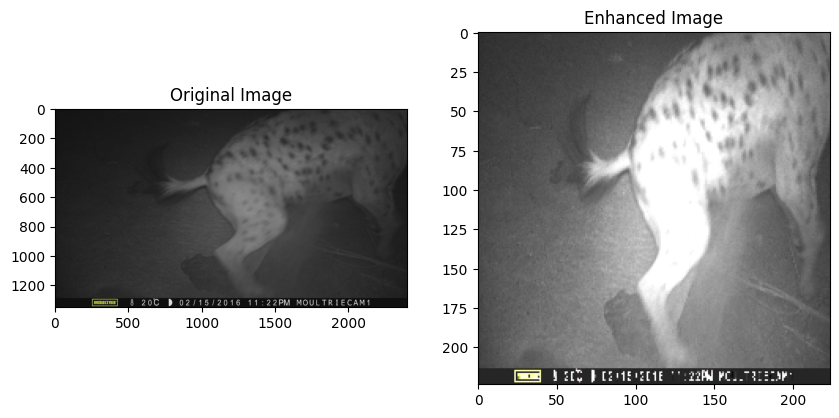

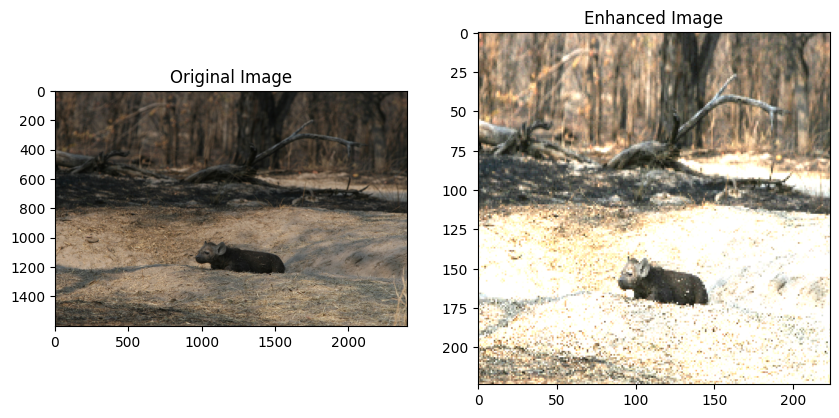

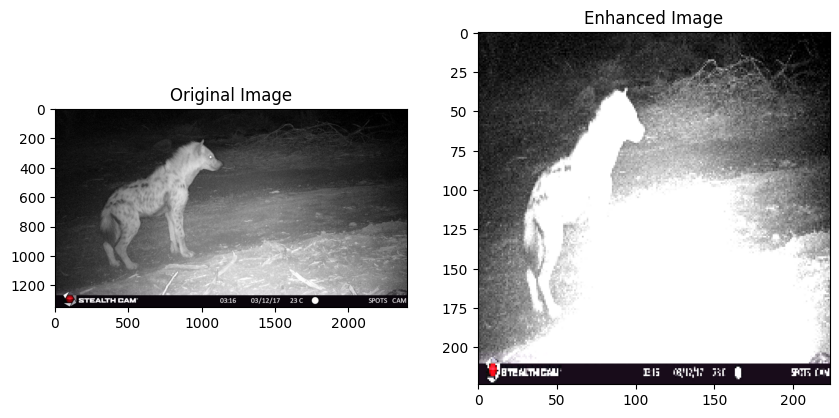

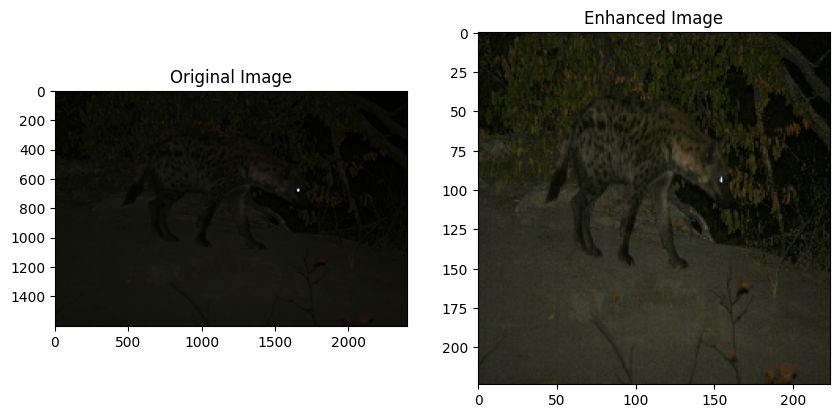

Enhancement and preprocessing completed.


In [4]:
import tensorflow as tf
import pathlib
import os
import matplotlib.pyplot as plt
import cv2

# function to check if an image is dark based on the brightness threshold
def is_dark_image(image_path, brightness_threshold=100):
    # loading the image using TensorFlow
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image)
    
    # calculating the brightness of the image by converting it to grayscale and finding the average brightness
    brightness = tf.reduce_mean(tf.image.rgb_to_grayscale(image))
    
    # checking if the image is dark or not based on the brightness threshold provided.
    return brightness < brightness_threshold

# original dir
path = './inp/'

# output dir
output_folder = "./result"
# creates ouptut dir if not exist
os.makedirs(output_folder, exist_ok=True)

# function to preprocess and enhance an image.
def preprocess_and_enhance_image(image):
    
    # Resize the image to a desired size.
    image = cv2.resize(image, image_size)

    # Normalize pixel values to fall within the range of 0 to 1.
    # image = image / 255.0

    # Adjust the brightness of the image (increase or decrease to control brightness).
    brightness = 2  # You can adjust this value, e.g., 1.1 for a slightly brighter result.
    enhanced_image = cv2.convertScaleAbs(image, alpha=brightness, beta=0)

    # Enhance the sharpness of the image (change kernel size and strength as needed).
    kernel_size = (1, 1)  # You can modify this, e.g., (5, 5) for a sharper image.
    sharpened_image = cv2.GaussianBlur(enhanced_image, kernel_size, 500)

    # Adjust the contrast (increase or decrease to control image contrast).
    contrast = 1.2  # Adjust this value, e.g., 1.2 for slightly more contrast.
    contrasted_image = cv2.convertScaleAbs(sharpened_image, alpha=contrast, beta=0)

    return contrasted_image

# listing all the dark images
dark_image_paths = [os.path.join(path, file) for file in os.listdir(path) if file.endswith(('.jpg', '.png', '.jpeg')) and is_dark_image(os.path.join(path, file))]

# the desired image size
image_size = (224, 224)

# loopiong throught all the dark images
for image_path in dark_image_paths:
    
    # Loadikng the original dark image.
    image = cv2.imread(image_path)

    # enhancing the dark images
    enhanced_image = preprocess_and_enhance_image(image)

    # saving the images that were enhanced
    output_path = os.path.join(output_folder, os.path.basename(image_path))
    cv2.imwrite(output_path, enhanced_image)

    # displaying the original and enhanced images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
    plt.title("Enhanced Image")
    plt.show()

print("Enhancement and preprocessing completed.")


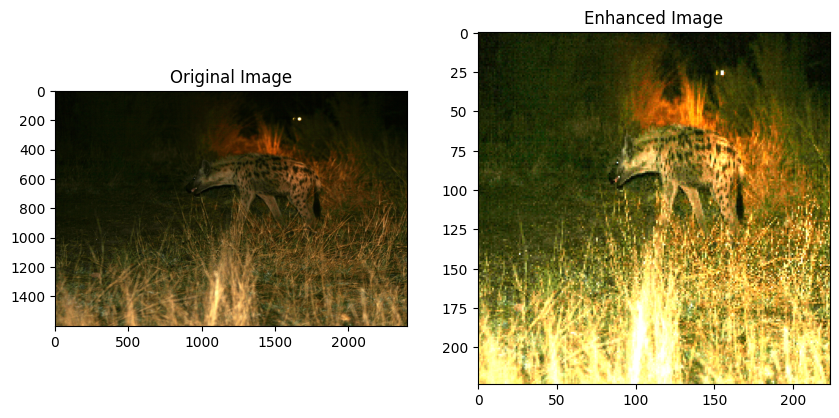

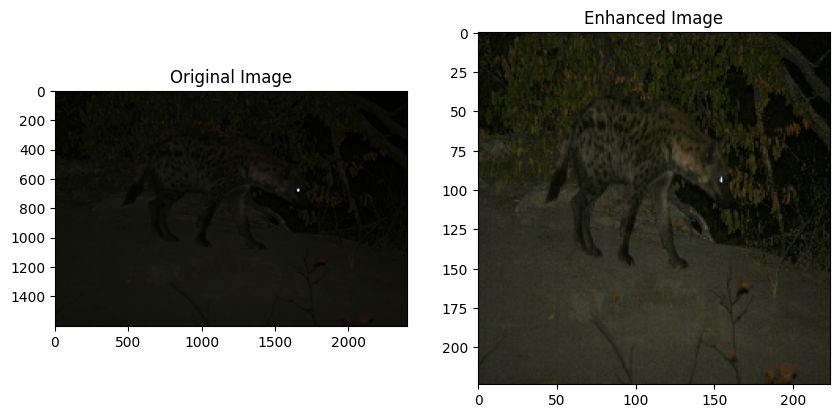

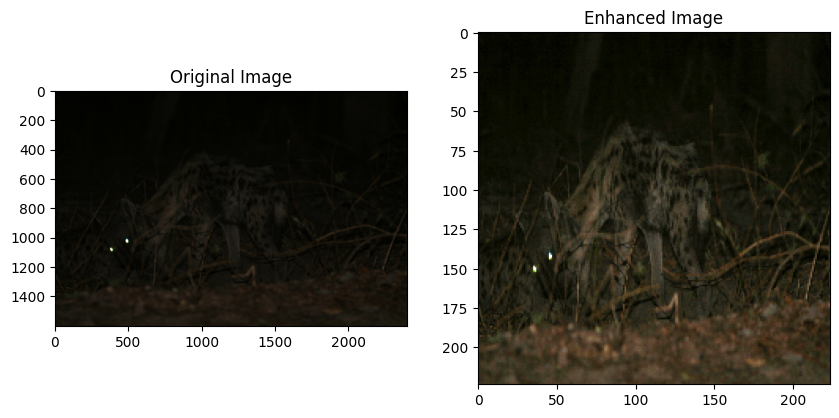

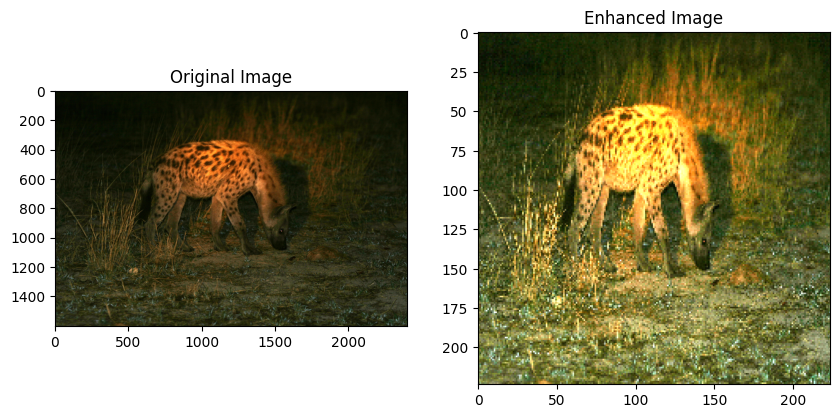

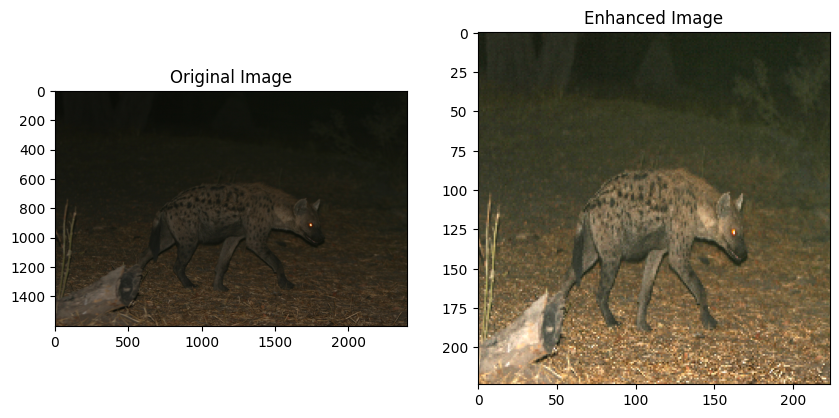

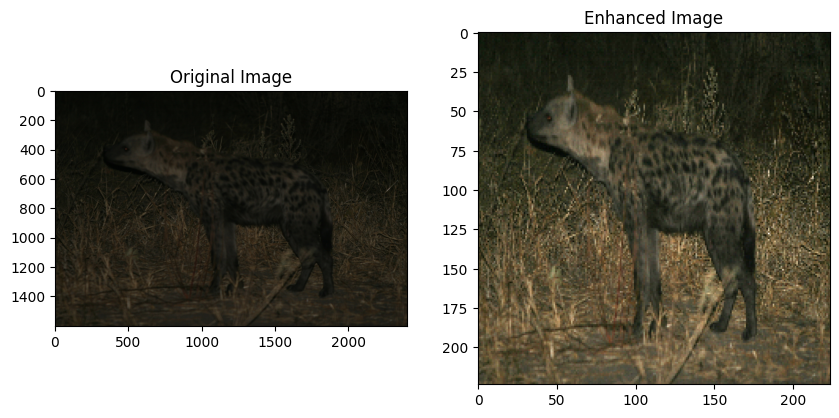

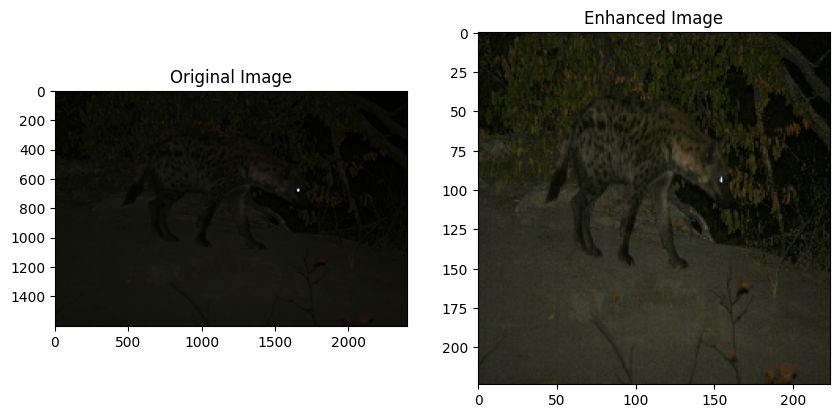

Enhancement and preprocessing completed.


In [10]:
import tensorflow as tf
import pathlib
import os
import matplotlib.pyplot as plt
import cv2

# Function to check if an image is dark based on the brightness threshold
def is_dark_image(image_path, brightness_threshold=50):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image)
    brightness = tf.reduce_mean(tf.image.rgb_to_grayscale(image))
    return brightness < brightness_threshold

# Function to preprocess and enhance an image
def preprocess_and_enhance_image(image):
    image = cv2.resize(image, image_size)
    brightness = 2
    enhanced_image = cv2.convertScaleAbs(image, alpha=brightness, beta=0)
    kernel_size = (1, 1)
    sharpened_image = cv2.GaussianBlur(enhanced_image, kernel_size, 500)
    contrast = 1.2
    contrasted_image = cv2.convertScaleAbs(sharpened_image, alpha=contrast, beta=0)
    return contrasted_image

# Original directory
path = './inp/'

# Output directory
output_folder = "./result"
# Create output directory if not exist
os.makedirs(output_folder, exist_ok=True)

# Desired image size
image_size = (224, 224)

# Loop through all images in the input directory
for file in os.listdir(path):
    if file.endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(path, file)

        # Check if the image is dark
        if is_dark_image(image_path):
            # Load the original dark image
            image = cv2.imread(image_path)

            # Enhance the dark image
            enhanced_image = preprocess_and_enhance_image(image)

            # Save the enhanced image
            output_path = os.path.join(output_folder, os.path.basename(image_path))
            cv2.imwrite(output_path, enhanced_image)

            # Display the original and enhanced images
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title("Original Image")
            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
            plt.title("Enhanced Image")
            plt.show()
        else:
            # If the image is not dark, copy it as it is
            output_path = os.path.join(output_folder, os.path.basename(image_path))
            original_image = cv2.imread(image_path)
            cv2.imwrite(output_path, original_image)

print("Enhancement and preprocessing completed.")
